

Este trabajo utilizaremos anuncios clasificados de venta de inmuebles del buscador Properati extraidos de la plataforma [Kaggle](https://www.kaggle.com/datasets/tomasaccini/propiedadesproperati). En el rubro inmobiliario es un tema importante es la tazacion de departamentos y casas siendo este uno de los temas de interes tanto para agentes inmobiliarios como potenciales compradores. La idea del proyecto es intentar predecir el precio de venta de inmuebles basandonos en sus caracteristicas. Trabajaremos con datos recolectados desde el año 2013 hasta el año 2017 inclusive.Cabe destacar que no existen muchos análisis de esta tematica de Sudamerica como asi tampoco particularmete de Argentina. Por ello cada registro del dataset con el que se desea trabajar es una publicacion de venta de una propiedad en Argentina donde utilizaremos su valor en dolares para no perder generalidad con respecto a la inflacion.

# Introducción

En el siguiente análisis buscamos filtrar los datos de properati para quedarnos con los que más utiles nos parezcan a la hora de tener que predecir un precio de una nueva propiedad. Incluye selección de los datos más importantes, limpieza de datos basura y visualizaciones para buscar relaciones entre las diferentes características de una propiedad.

### Lectura y agrupamiento de los datos

Primero importamos las librerias necesarias para poder realizar la exploración de datos.

In [37]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import math
import missingno as msno
from google.colab import drive

#plt.style.use('default')# Make the graphs a bit prettier

In [38]:
drive.mount('/content/drive') #comando que nos permite acceder a las carpetas de drive.

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


### Preparación de los dataframes

La descarga de los datos se realiza atravez de la API provista por Kaggle.

In [40]:
! pip install -q kaggle
from google.colab import files
files.upload()
! mkdir ~/.kaggle
! cp kaggle.json ~/.kaggle/

Saving kaggle.json to kaggle.json
mkdir: cannot create directory ‘/root/.kaggle’: File exists


In [41]:
! rm 'kaggle.json'

In [42]:
#!ls

In [43]:
! kaggle datasets download -d tomasaccini/propiedadesproperati #direccion de los datasets

100% 116M/116M [00:07<00:00, 18.5MB/s]
100% 116M/116M [00:07<00:00, 17.2MB/s]


In [44]:
import zipfile

archivo_zip = "propiedadesproperati.zip"
with zipfile.ZipFile(archivo_zip, 'r') as zip_ref:
    zip_ref.extractall()


In [ ]:
#!ls

In [45]:
df1 = pd.read_csv('properati-AR-2013-08-01-properties-sell.csv')
df2 = pd.read_csv('properati-AR-2014-02-01-properties-sell.csv')
df3 = pd.read_csv('properati-AR-2014-09-01-properties-sell.csv')
df4 = pd.read_csv('properati-AR-2015-01-01-properties-sell.csv')
df5 = pd.read_csv('properati-AR-2015-07-01-properties-sell-six_months.csv')
df6 = pd.read_csv('properati-AR-2015-12-01-properties-sell-six_months.csv')
df7 = pd.read_csv('properati-AR-2016-06-01-properties-sell.csv')
df8 = pd.read_csv('properati-AR-2017-01-01-properties-sell.csv')
df9 = pd.read_csv('properati-AR-2017-08-01-properties-sell-six_months.csv')

In [46]:
df1a4=pd.concat([df1,df2,df3,df4], axis=0)
df5a9=pd.concat([df5,df6,df7,df8,df9], axis=0)

In [47]:
df1a4.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 255079 entries, 0 to 67180
Data columns (total 20 columns):
 #   Column                      Non-Null Count   Dtype  
---  ------                      --------------   -----  
 0   created_on                  255079 non-null  object 
 1   operation                   255079 non-null  object 
 2   property_type               255079 non-null  object 
 3   place_name                  255079 non-null  object 
 4   place_with_parent_names     255079 non-null  object 
 5   geonames_id                 217108 non-null  float64
 6   lat-lon                     205097 non-null  object 
 7   lat                         205097 non-null  float64
 8   lon                         205094 non-null  float64
 9   price                       200715 non-null  float64
 10  currency                    200715 non-null  object 
 11  price_aprox_local_currency  200715 non-null  float64
 12  price_aprox_usd             200715 non-null  float64
 13  surface_in_m2  

In [48]:
df5a9.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 298453 entries, 0 to 121219
Data columns (total 27 columns):
 #   Column                      Non-Null Count   Dtype  
---  ------                      --------------   -----  
 0   id                          298453 non-null  object 
 1   created_on                  298453 non-null  object 
 2   operation                   298453 non-null  object 
 3   property_type               298453 non-null  object 
 4   place_name                  298410 non-null  object 
 5   place_with_parent_names     298453 non-null  object 
 6   country_name                298453 non-null  object 
 7   state_name                  298453 non-null  object 
 8   geonames_id                 251117 non-null  float64
 9   lat-lon                     201892 non-null  object 
 10  lat                         201892 non-null  float64
 11  lon                         201892 non-null  float64
 12  price                       263858 non-null  float64
 13  currency      


Como se puede observar, los dataframes 1 a 4 tienen una estructura diferente a los dataframes 5 a 9. Esto puede deberse a un cambio en el proceso de guardado de la información por parte de Properati. Ahora lo siguiente a hacer es unificarlos en un único dataframe que los contenga a todos. Para ello se realizara analisis de las distintas columnas para llegar a un resultado optimo.

### Analisis de Caracteristicas

In [49]:
unique_cols_df1a4=set(df1a4.columns)-set(df5a9.columns)
unique_cols_df5a9=set(df5a9.columns)-set(df1a4.columns)
common_cols=set(df5a9.columns)-unique_cols_df5a9
print('lista de caracteristicas de caracteristicas comunes', common_cols)
print('lista de caracteristicas de df1a4 que no estan en df5a9', unique_cols_df1a4)
print('lista de caracteristicas de df5a9 que no estan en df1a4', unique_cols_df5a9)


lista de caracteristicas de caracteristicas comunes {'price_usd_per_m2', 'operation', 'expenses', 'place_name', 'lon', 'image_thumbnail', 'price_aprox_local_currency', 'price_aprox_usd', 'lat-lon', 'currency', 'created_on', 'geonames_id', 'lat', 'rooms', 'properati_url', 'floor', 'price', 'property_type', 'place_with_parent_names'}
lista de caracteristicas de df1a4 que no estan en df5a9 {'surface_in_m2'}
lista de caracteristicas de df5a9 que no estan en df1a4 {'description', 'price_per_m2', 'country_name', 'id', 'state_name', 'title', 'surface_total_in_m2', 'surface_covered_in_m2'}


Caracteristicas compartidas en ambos dataframes


* '**created_on**': Fecha de creacion del registro, YYYY-MM-DD.
* '**operation**': Tipo de operacion de la publicacion, en este caso todas son ventas.
* '**property_type**' : Tipo de propiedad de las cuales puede ser 'house', 'apartment', 'PH', 'store'.
* '**place_name**': Pais en el que se encuentra la propiedad.
* '**place_with_parent_names**': Dato concatenado que provee, Pais,Provincia,Ciudad, Barrio. su formato es x|x|x|x o x|x|x. Donde el tercer lugar y cuarto no necesariamente son Ciudad y Barrio.
* '**geonames_id**': ID interno de Properati.
* '**lat-lon**' : Dato que concatena la latitud y longitud.
* '**lat**': Latitud geografica.
* '**lon**': Longitud geografica.
* '**price**': Precio.
* '**currency**': Moneda en la cual se encuentra el precio.
* '**price_aprox_local_currency**':Precio aproximado en la moneda local.
* '**price_aprox_usd**':Precio aproximado en dolares.

* '**price_usd_per_m2**':Precio en USD por metro cuadrado.
* '**floor**': Cantidad de pisos.
* '**rooms**': Cantidad de habitaciones.
* '**expenses**': Expensas.
* '**properati_url**': Direccion URL de la publicacion a Properati.
* '**image_thumbnail**': Direccion a imagen de la propiedad.



Caracteristicas que están en df1a4 pero no están en df5a9
* **'surface_in_m2'**: Superficie en metros cuadrados.

caracteristicas unicas en el df5a9

* '**id**': Id unico de la publicacion
* '**country_name**': Nombre del pais
* '**state_name**': Nombre de la provicia
* '**surface_total_in_m2**': superficie total en metros cuadrados
* '**surface_covered_in_m2**': superficie cubierta en metros cuadrados
* '**price_per_m2**': precio por metro cuadrado
* '**description**': descripcion de la publicacion, a lo largo de la limpieza de la curacion nos servira para completar otras caracteristicas
* '**title**': titulo de la publicacion.


## Limpieza y Curado del dataset

Sacaremos información redundante o que no aporta al análisis, como datos internos que guarda Properati.
* '**id**': No nos aporta información.
* '**operation**': Todas las operaciones son de venta.
* '**geonames_id**': Es un id interno de Properati.
* '**lat-lon**': Es un campo que concatena los datos de los campos 'lat' y 'lon', por lo que es redundante.
* '**properati_url**': No nos aporta información.
* '**image_thumbnail**': No nos aporta información.



Verificamos que solo son ventas

In [50]:
print(df1a4.operation.unique(),df5a9.operation.unique())

['sell'] ['sell']


In [51]:
df1a4 = df1a4.drop(df1a4[['created_on','operation','geonames_id', 'lat-lon','place_name', 'properati_url','image_thumbnail']], axis = 1)
df5a9 = df5a9.drop(df5a9[['id','created_on','operation', 'geonames_id','place_name','state_name', 'lat-lon', 'properati_url','image_thumbnail','country_name', 'title']], axis = 1)

Observar que el dataset `df5a9` tiene una categoria que `description` de la cual podemos recuperar diversos datos de otras categorias.

### Caracteristica `surface_in_m2`

In [52]:
cant_surf_old=df5a9['surface_total_in_m2'].count() #Contador de datos en surface_total_in_m2 antes de recuperar.

# Obtenemos la superficie en m2 desde la descripción.

tmp = df5a9.loc[(df5a9['surface_total_in_m2'].isnull()), 'description'].str.lower().str.extract("(\d+)(\s|())(mt|m2|metros|metros2)", expand=False)
'''
Selecciona las filas en las que el valor de la columna 'surface_total_in_m2' es
NaN y extrae la información de la columna 'description' en minúsculas. Luego,
utiliza una expresión regular para buscar un número seguido de la palabra
"mt","m2",etc. La función extract() captura el número encontrado y el espacio en blanco que lo
precede, si corresponde, y lo guarda en la variable 'tmp'.
'''
# Asignamos la cantidad de ambientes, al dataset original donde `surface_total_in_m2` es NaN
df5a9.loc[df5a9['surface_total_in_m2'].isnull(),'surface_total_in_m2'] = tmp[0]

df5a9['surface_total_in_m2'] = df5a9['surface_total_in_m2'].astype(float)

# Contamos la cantidad de datos recuperados.
cant_surf_new=df5a9['surface_total_in_m2'].count()
print('Se puede observar que pudimos obtener de la caracteristica surface_total_in_m2', cant_surf_new-cant_surf_old, 'registros nuevos.')


Se puede observar que pudimos obtener de la caracteristica surface_total_in_m2 30772 registros nuevos.


In [53]:
#invertimos los datos de superficies en los cuales surface_covered_in_m2 sea mayor a surface_total_in_m2
covered_mayor_total = df5a9['surface_covered_in_m2'] > df5a9['surface_total_in_m2']
#print(f'Cantidad de filas con sup_cov > sup_total: {covered_mayor_total.sum()}')

def invertir_sup_cov(row):
    if row['surface_covered_in_m2'] > row['surface_total_in_m2']:
        return row['surface_total_in_m2'], row['surface_covered_in_m2']
    else:
        return row['surface_covered_in_m2'], row['surface_total_in_m2']

df5a9['surface_covered_in_m2'], df5a9['surface_total_in_m2'] = zip(*df5a9.apply(invertir_sup_cov, axis=1)) #invierte los datos


Limpiamos en los dataframe de los registros con datos de superficie invalidos (menores a 10, mayores a 10000, por ser valores lejanos a la realidad). Notar que `df1a4` tiene una sola categoria referida a la superficie (`surface_in_m2`), mientras que `df5a9` tiene dos `surface_total_in_m2` y `surface_covered_in_m2`. Para evitarnos eliminar columnas importantes procederemos a unificar `surface_total_in_m2` con `surface_covered_in_m2` en la categoria `surface_in_m2`.

In [54]:
cant_surf_old=df1a4['surface_in_m2'].count()
invalidos = ((df1a4['surface_in_m2'] < 10) | (df1a4['surface_in_m2'] > 10000))
df1a4 = df1a4[~invalidos]

cant_surf_new=df1a4['surface_in_m2'].count()
print('Se puede observar que en la caracteristica surface_in_m2 eliminamos', cant_surf_old-cant_surf_new, 'datos erroneos')

Se puede observar que en la caracteristica surface_in_m2 eliminamos 813 datos erroneos


In [55]:
cant_surf_old=df5a9['surface_covered_in_m2'].count()

invalidos = ((df5a9['surface_covered_in_m2'] < 10) | (df5a9['surface_covered_in_m2'] > 10000)) & ((df5a9['surface_total_in_m2'] < 10) | (df5a9['surface_total_in_m2'] > 10000))
df5a9 = df5a9[~invalidos]  # Seleccionar filas que no cumplan la condición de tener valores inválidos en ambas columnas
cant_surf_new=df5a9['surface_covered_in_m2'].count()
print('Se puede observar que eliminamos', cant_surf_old-cant_surf_new,'registros con datos erroneos en las caracteristica surface_covered_in_m2 y surface_total_in_m2')
ambos_iguales = df5a9['surface_covered_in_m2'] == df5a9['surface_total_in_m2']
ambos_iguales.value_counts()

Se puede observar que eliminamos 1567 registros con datos erroneos en las caracteristica surface_covered_in_m2 y surface_total_in_m2


False    238872
True      58014
dtype: int64

Se tiene 58014 registros que son iguales, los cuales podemos unificar sin problema. Nos quedaremos con el valor de `surface_total_in_m2`. En caso de ser nulo nos quedamos con la superficie cubierta. El resultado lo guardaremos en una nueva columna llamada `surface_in_m2`, como en df1a4.

In [56]:
def obtener_superficie_final(row):
    covered = row['surface_covered_in_m2']
    total = row['surface_total_in_m2']
    if pd.isnull(covered):
        return total
    elif pd.isnull(total):
        return covered
    elif covered == total:
        return total
    else:
        return total

df5a9['surface_in_m2'] = df5a9.apply(obtener_superficie_final, axis=1)
df5a9 = df5a9.drop(['surface_covered_in_m2', 'surface_total_in_m2'], axis=1)

cant_surf_old=cant_surf_new
cant_surf_new=df5a9['surface_in_m2'].count()
print('se puede observar que pudimos rescatar de la caracteristica surface_in_m2', cant_surf_new-cant_surf_old, 'registros')


se puede observar que pudimos rescatar de la caracteristica surface_in_m2 28561 registros


### Caracteristica `rooms`

In [57]:
cant_rooms_old=df5a9['rooms'].count() #contador de datos

In [58]:
#Primero vemos si podemos recuperar datos de la descripción
cant_ambientes_old=df5a9['rooms'].count() #guardamos en una variable para comparar cuantos datos ganamos.

tmp1 = df5a9.loc[(df5a9['rooms'].isnull()),'description'].str.lower().str.extract("(\d+)(\s|())amb", expand=False)
'''
Selecciona las filas en las que el valor de la columna 'rooms' es NaN y extrae
la información de la columna 'description' en minúsculas. Luego, utiliza una
expresión regular para buscar un número seguido de la palabra "amb"
(por ejemplo, "2 ambientes", "3amb", etc.). La función extract() captura el
número encontrado y el espacio en blanco que lo precede, si corresponde,
y lo guarda en la variable 'tmp'.
'''
# Asigno la cantidad de ambientes, al dataset original donde rooms es NaN
df5a9.loc[df5a9['rooms'].isnull(),'rooms'] = tmp1[0]

# Asignamos 1 a las propiedades que en su descripción tengan la palabra 'monoambiente'
df5a9.loc[(df5a9['rooms'].isnull()) & (df5a9['description'].str.lower().str.contains('monoambiente')),'rooms'] = 1

df5a9['rooms'] = df5a9['rooms'].astype(float)

# Contamos la cantidad de datos recuperados
cant_ambientes_new=df5a9['rooms'].count()
print('se puede observar que pudimos rescatar de la caracteristica rooms', cant_ambientes_new-cant_ambientes_old, 'registros')



se puede observar que pudimos rescatar de la caracteristica rooms 42544 registros


Vamos a asumir que los departamentos que no tienen completo el atributo `rooms` son monoambientes.

In [59]:
def monoambientes(df):
  df.loc[df['property_type'] == 'apartment', 'rooms'] = df.loc[df['property_type'] == 'apartment', 'rooms'].fillna(1)
  return df

In [60]:
cant_rooms_old1a4=df1a4['rooms'].count()
cant_rooms_old5a9=df5a9['rooms'].count()

df1a4=monoambientes(df1a4)
df5a9=monoambientes(df5a9)

# Contamos la cantidad de datos recuperados
cant_rooms_new1a4=df1a4['rooms'].count()
cant_rooms_new5a9=df5a9['rooms'].count()
print('Se puede observar que pudimos recuperar de la caracteristica rooms',
      cant_rooms_new1a4-cant_rooms_old1a4,'registros en df1a4 y',cant_rooms_new5a9-cant_rooms_old5a9, 'registros en df5a9' )


Se puede observar que pudimos recuperar de la caracteristica rooms 32371 registros en df1a4 y 38589 registros en df5a9


### Categoria `price`

In [61]:
#contador de datos en price antes de recuperar
cant_price_old=df5a9['price'].count()#guardamos en una variable para comparar cuantos datos ganamos.

In [62]:
#Recuperamos datos de la descripción

tmp = df5a9.loc[(df5a9['price'].isnull()), 'description'].str.lower().str.extract("(\d+)(\s|())($USD|$US|precio|usd)", expand=False)
'''
Selecciona las filas en las que el valor de la columna 'price_per_m2' es NaN y extrae
la información de la columna 'description'. Luego, utiliza una
expresión regular para buscar un número seguido de la palabra "precio", "$", etc.
La función extract() captura el número encontrado y el espacio en blanco que lo precede, si corresponde,
y lo guarda en la variable 'tmp'.
'''
# Asigno la cantidad de ambientes, al dataset original donde rooms es NaN
df5a9.loc[df5a9['price'].isnull(),'price'] = tmp[0]

# Asignamos 1 a las propiedades que en su descripción tengan la palabra 'monoambiente'
#inmuebles.loc[(inmuebles['rooms'].isnull()) & (inmuebles['description'].str.lower().str.contains('monoambiente')),'rooms'] = 1

df5a9['price'] = df5a9['price'].astype(float)

# Contamos la cantidad de datos recuperados
cant_price_new=df5a9['price'].count()
print('se puede observar que pudimos rescatar de la caracteristica price', cant_price_new-cant_price_old, 'registros')

se puede observar que pudimos rescatar de la caracteristica price 182 registros


In [63]:
price_old=df1a4['price'].count()
invalidos = ((df1a4['price'] < 500) )
df1a4 = df1a4[~invalidos]

price_new=df1a4['price'].count()
print('Se puede observar que en la caracteristica price_usd_per_m2 eliminamos', price_old-price_new, 'datos erroneos')

Se puede observar que en la caracteristica price_usd_per_m2 eliminamos 0 datos erroneos


In [64]:
price_old=df5a9['price'].count()
invalidos = ((df5a9['price'] < 500) )
df5a9 = df5a9[~invalidos]

price_new=df5a9['price'].count()
print('Se puede observar que en la caracteristica price_usd_per_m2 eliminamos', price_old-price_new, 'datos erroneos')

Se puede observar que en la caracteristica price_usd_per_m2 eliminamos 14275 datos erroneos


### Categoria `price_per_m2`

Limpiemos el dataframe de los registros con datos de precios invalidos (menores a 100, mayores a 10.000, por ser valores lejanos a la realidad).
En `df5a9` tenemos que unificar `price_usd_per_m2` con `price_per_m2`. Puede parecer que aca se estarian mezclando valores de monedas pero luego filtrando por el atributo `currency` elegimos los registros que solo sean en dolares. Es decir nos quedamos con las filas en las que `price_per_m2` esta en dolares.

In [65]:
cant_price_old=df1a4['price_usd_per_m2'].count()
invalidos = ((df1a4['price_usd_per_m2'] < 10) | (df1a4['price_usd_per_m2'] > 10000))
df1a4 = df1a4[~invalidos]

cant_price_new=df1a4['price_usd_per_m2'].count()
print('Se puede observar que en la caracteristica price_usd_per_m2 eliminamos', cant_price_old-cant_price_new, 'datos erroneos')

Se puede observar que en la caracteristica price_usd_per_m2 eliminamos 2198 datos erroneos


In [66]:
invalidos = ((df5a9['price_usd_per_m2'] < 100) | (df5a9['price_usd_per_m2'] > 10000)) & ((df5a9['price_per_m2'] < 100) | (df5a9['price_per_m2'] > 10000))
df5a9 = df5a9[~invalidos]  # Seleccionar filas que no cumplan la condición de tener valores inválidos en ambas columnas
ambos_iguales = df5a9['price_usd_per_m2'] == df5a9['price_per_m2']
ambos_iguales.value_counts()

False    241868
True      39635
dtype: int64



Hay 39635 registros que son iguales, los cuales podemos unificar sin problema.  Nos quedaremos con el valor de `price_per_m2`. En caso de ser nulo nos quedamos con el valor de metro cuadrado en dolares. El resultado lo guardaremos en una nueva columna llamada `price_per_m2`, como en df1a4.

In [67]:
def obtener_precio_por_m2_final(price_usd_per_m2, price_per_m2):
    if pd.isnull(price_usd_per_m2):
        return price_per_m2
    elif pd.isnull(price_per_m2):
        return price_usd_per_m2
    elif price_usd_per_m2 == price_per_m2:
        return price_per_m2
    else:
        return price_per_m2

df5a9.loc[:, 'price_usd_per_m2'] = df5a9[['price_usd_per_m2', 'price_per_m2']].apply(lambda x: obtener_precio_por_m2_final(x[0], x[1]), axis=1)
df5a9 = df5a9.drop('price_per_m2', axis=1)


### Categoria `place_with_parent_names`

Nuestra idea es sacar del atributo place_with_parent_names los datos Pais, Provincia, Ciudad y Barrio. Se desea validar la informacion que se tiene en el atributo `ciudad` para ello se consiguio una base de datos de SQL que se paso a SQLite para poder luego tratarla en este Collab. El proceso de validacion para no perder datos consiste en crear la columna `validacion`  la cual tiene True si coinciden las columnas de provincia, ciudad con la nueva base de datos de ciudades por provincia. Este algoritmo nos dio malos resultados por lo cual decidimos solo quedarnos con la columna `Provincia` para aplicar los arlgoritmos de aprendizaje. Sin embargo aca esta el codigo que hice.

In [69]:
def split_place(df):
  # Extraer las columnas de país, provincia, ciudad y barrio si hay cuatro elementos
  df[['pais', 'provincia', 'ciudad', 'barrio']] = df['place_with_parent_names'].str.extract(r'\|([^|]+)\|([^|]+)?\|([^|]+)?\|?([^|]+)?|$', expand=True)
  # Reemplazar valores vacíos por NaN
  df.replace('', np.nan, inplace=True)
  return df

In [70]:
df1a4=split_place(df1a4)
df5a9=split_place(df5a9)

In [71]:
#estas funciones reemplazan todos los nombres distintos de partes de buenos aires a solo buenos aires.

def crear_diccionario(lista, valor_fijo):
    diccionario = {}
    for elemento in lista:
        diccionario[elemento] = valor_fijo
    return diccionario

def reemplazo_bsas(df):
  filtro = df.provincia.str.startswith(('Bs.As.', 'Buenos'))
  bs_filtrados = df.loc[filtro, 'provincia'].unique()
  bs_filtrados = crear_diccionario(bs_filtrados,'buenos aires')
  df['provincia'] = df['provincia'].replace(bs_filtrados)
  return df

In [72]:
df1a4=reemplazo_bsas(df1a4)
df5a9=reemplazo_bsas(df5a9)

##### Validacion de ciudades

la base de datos se extrajo del siguiente link:
https://gist.github.com/CharlyJazz/b323b4937d0c3be6fa6142f876b742d5#file-argentina_provincias_ciudades-sql


In [ ]:
#subimos el archivo
files.upload()

Saving Argentina.db to Argentina (1).db


{'Argentina.db': b'SQLite format 3\x00\x10\x00\x01\x01\x00@  \x00\x00\x00\x03\x00\x00\x00\x11\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x14\x00\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00.O}\r\x00\x00\x00\x03\x0e\x81\x00\x0f*\x0f|\x0e\x81\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00

In [ ]:
import sqlite3

In [ ]:
conn = sqlite3.connect('Argentina.db')

# querys para armar los dataframes en pandas
query1 = "SELECT * FROM provincias"
query2 = "SELECT * FROM localidades"

# Ejecutar la consulta y cargar los resultados en un DataFrame
provincias = pd.read_sql_query(query1, conn)
localidades = pd.read_sql_query(query2, conn)
# Cerrar la conexión a la base de datos
conn.close()


In [ ]:
provincias.head()

,id,provincia
0,1,Buenos Aires
1,2,Buenos Aires-GBA
2,3,Capital Federal
3,4,Catamarca
4,5,Chaco


In [ ]:
localidades.head()

,id,id_provincia,localidad
0,1,1,25 de Mayo
1,2,1,3 de febrero
2,3,1,A. Alsina
3,4,1,A. Gonzáles Cháves
4,5,1,Aguas Verdes


In [ ]:
#reemplaza los id_provincia por las provincias
localidades['id_provincia'] = localidades['id_provincia'].map(provincias.set_index('id')['provincia'])
localidades = localidades.rename(columns={'id_provincia': 'provincia'})

In [ ]:
localidades

,id,provincia,localidad
0,1,Buenos Aires,25 de Mayo
1,2,Buenos Aires,3 de febrero
2,3,Buenos Aires,A. Alsina
3,4,Buenos Aires,A. Gonzáles Cháves
4,5,Buenos Aires,Aguas Verdes
...,...,...,...
2377,2378,Tucumán,Villa de Leales
2378,2379,Tucumán,Villa Quinteros
2379,2380,Tucumán,Yánima
2380,2381,Tucumán,Yerba Buena


In [ ]:
#pasamos a minusculas todos los campos que queremos comparar para no tener problemas
localidades.loc[:,'provincia'] = localidades.loc[:,'provincia'].str.lower()
localidades.loc[:,'localidad']    = localidades.loc[:,'localidad'].str.lower()


df1a4.loc[:,'provincia'] = df1a4.loc[:,'provincia'].str.lower()
df1a4.loc[:,'ciudad']    = df1a4.loc[:,'ciudad'].str.lower()
df1a4.loc[:,'barrio']    = df1a4.loc[:,'barrio'].str.lower()

df5a9.loc[:,'provincia'] = df5a9.loc[:,'provincia'].str.lower()
df5a9.loc[:,'ciudad']    = df5a9.loc[:,'ciudad'].str.lower()
df5a9.loc[:,'barrio']    = df5a9.loc[:,'barrio'].str.lower()

In [ ]:
#funcion de validacion
def validacion(inm2,dfvalidacion):
  inm2['validacion'] = False
  for i in np.arange(inm2.shape[0]):
    for provincia in set(dfvalidacion.provincia): #elige una provincia del set
      if (provincia == inm2.iloc[i,16]):
        if inm2.iloc[i,17] in set(dfvalidacion[dfvalidacion['provincia']==provincia].localidad.unique()):
          inm2.loc[i, 'validacion'] = True
  return inm2

In [ ]:
#df1a4=validacion(df1a4,localidades)
#df5a9=validacion(df5a9,localidades)

In [ ]:
#Guardamos el dataset validado

#df5a9.to_csv('/content/df5a9.csv', index=False)
#files.download('/content/df5a9.csv')


### Union de los dataset

Verifiquemos que ambas estructuras tienen las mismas columnas, y concatenemos todas las publicaciones en un unico dataframe llamado inmuelbes.


In [73]:
columns1a4 = df1a4.columns.tolist().sort()
columns5a9 = df5a9.columns.tolist().sort()
columns1a4 == columns5a9

True

Finalmente podemos unir nuestros conjuntos y obtenemos uno nuevo con las siguientes caracteristicas:


In [74]:
inmuebles = pd.concat([df1a4,df5a9])
inmuebles.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 533571 entries, 0 to 121219
Data columns (total 18 columns):
 #   Column                      Non-Null Count   Dtype  
---  ------                      --------------   -----  
 0   property_type               533571 non-null  object 
 1   place_with_parent_names     533571 non-null  object 
 2   lat                         391084 non-null  float64
 3   lon                         391081 non-null  float64
 4   price                       445365 non-null  float64
 5   currency                    445276 non-null  object 
 6   price_aprox_local_currency  445276 non-null  float64
 7   price_aprox_usd             445276 non-null  float64
 8   surface_in_m2               418241 non-null  float64
 9   price_usd_per_m2            354318 non-null  float64
 10  floor                       71220 non-null   float64
 11  rooms                       425825 non-null  float64
 12  expenses                    36355 non-null   object 
 13  pais          

Tenemos ahora un solo dataframe con 547846 registros. La direccion de esta parte de la curacion y limpieza es eliminar los nans de distintas formas asi como ajustar cosas que no se realizaron previamente.

Veamos graficamente donde se encuentran los datos nulos de cada caracteristica.

<Axes: >

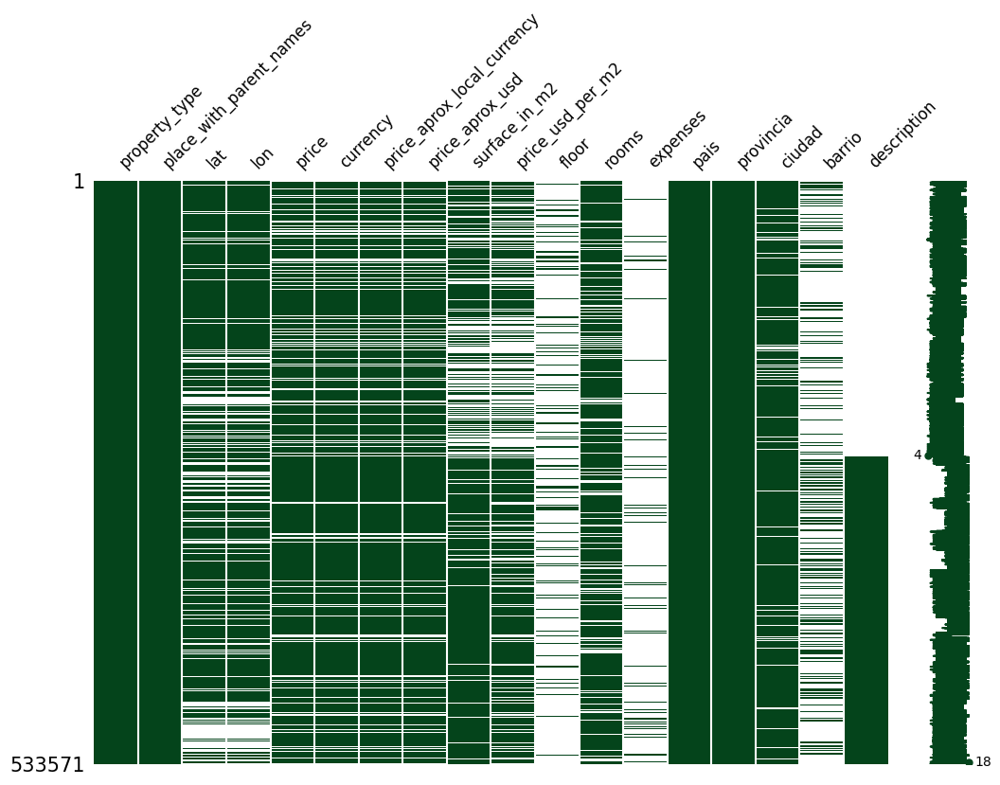

In [79]:
msno.matrix(inmuebles, figsize=(12, 8),fontsize=12, color=(0.0157, 0.2667, 0.1098))

Este grafico nos muestra en donde estan ubicados los nans en cada registro, no coloreando la linea en esa categoria si tenemos nan.

Ahora quitamos clases de categorias que no son de nuestro interes para el analisis, como el tipo de cambio de los clasificados como el tipo de propiedades que queremos analizar. En esta ultima categoria nos quedaremos solo con Casas, Departamentos y PHs.

In [80]:
#quitamos las clases que no es necesario utilizar
print('Las distintos tipos de monedas que tenemos en el dataset son:', inmuebles['currency'].unique())
inmuebles = inmuebles.loc[inmuebles['currency'] == 'USD']
clases1 = inmuebles['currency'].unique()

print('Nos quedamos solo con:',clases1)

print('')
print('Las distintas clases de propiedades:', inmuebles['property_type'].unique())
inmuebles = inmuebles.loc[inmuebles['property_type'] != 'store']
clases2 =inmuebles['property_type'].unique()
print('Nos quedamos solo con:',clases2)
#inmuebles.info()

Las distintos tipos de monedas que tenemos en el dataset son: [nan 'USD' 'ARS' 'BRL' 'PEN' 'UYU']
Nos quedamos solo con: ['USD']

Las distintas clases de propiedades: ['house' 'apartment' 'PH' 'store']
Nos quedamos solo con: ['house' 'apartment' 'PH']


In [81]:
def inspect_dataframe(df):
    "Muestra porcentages de nans en el dataframe"
    # Cantidad total de registros
    total_rows = len(df)
    # Creamos el dataframe donde vamos a mostrar la estructura del dataset
    # Algo así como el .info() pero con mas información.
    df_retval = pd.DataFrame(columns=['NaNs #','NaNs %','Type'])
    # Por cada columna
    for col in df.columns:
        # Cantidad de Valores nulos
        nan_values = df[col].isnull().sum()
        # Porcentaje de Valores Nulos en el dataset
        nan_percentage = nan_values / total_rows * 100
        # El tipo de dato de la columna
        datatype = df[col].dtype
        # Agrego la fila al dataframe
        df_retval.loc[col] = [nan_values, nan_percentage, datatype]
    # Ordeno los valores por % de NaNs
    return df_retval.sort_values(by='NaNs %', ascending=False)

In [82]:
inspect_dataframe(inmuebles)

,NaNs #,NaNs %,Type
expenses,347067,91.518626,object
floor,325368,85.796783,float64
barrio,235515,62.103309,object
description,165355,43.602712,object
lon,101041,26.643655,float64
lat,101038,26.642864,float64
price_usd_per_m2,74737,19.707513,float64
rooms,71722,18.912483,float64
surface_in_m2,70017,18.462889,float64
ciudad,24686,6.509489,object


Procedemos a elminar columnas que no van a aportar informacion al analisis o a las cuales ya se les realizo algun tipo de curado.

In [83]:
inmuebles = inmuebles.drop(['place_with_parent_names', #utliziamos este campo para extraer informacion
                'currency', #esta entrada es igual para todos los registros
                'floor', #lamentablemente la base de datos carece de este dato en el %85.79 de los registros
                'expenses', #lamentablemente la base de datos carece de este dato en el %91.51 de los registros
                'pais',#esta entrada es igual para todos los registros
                'ciudad', #la extraemo por que no podemos validar bien la informacion de esta categoria combia a veces barrios con ciudades
                'barrio', #lamentablemente la base de datos carece de este dato en el %62.10 de los registros
                'description' #utiliziamos este campo para extraer informacion
                ], axis=1)
#inmuebles = inmuebles.dropna()
inmuebles.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 379231 entries, 4 to 121219
Data columns (total 10 columns):
 #   Column                      Non-Null Count   Dtype  
---  ------                      --------------   -----  
 0   property_type               379231 non-null  object 
 1   lat                         278193 non-null  float64
 2   lon                         278190 non-null  float64
 3   price                       379231 non-null  float64
 4   price_aprox_local_currency  379231 non-null  float64
 5   price_aprox_usd             379231 non-null  float64
 6   surface_in_m2               309214 non-null  float64
 7   price_usd_per_m2            304494 non-null  float64
 8   rooms                       307509 non-null  float64
 9   provincia                   379231 non-null  object 
dtypes: float64(8), object(2)
memory usage: 31.8+ MB


Analicemos la correlacion de las columnas.

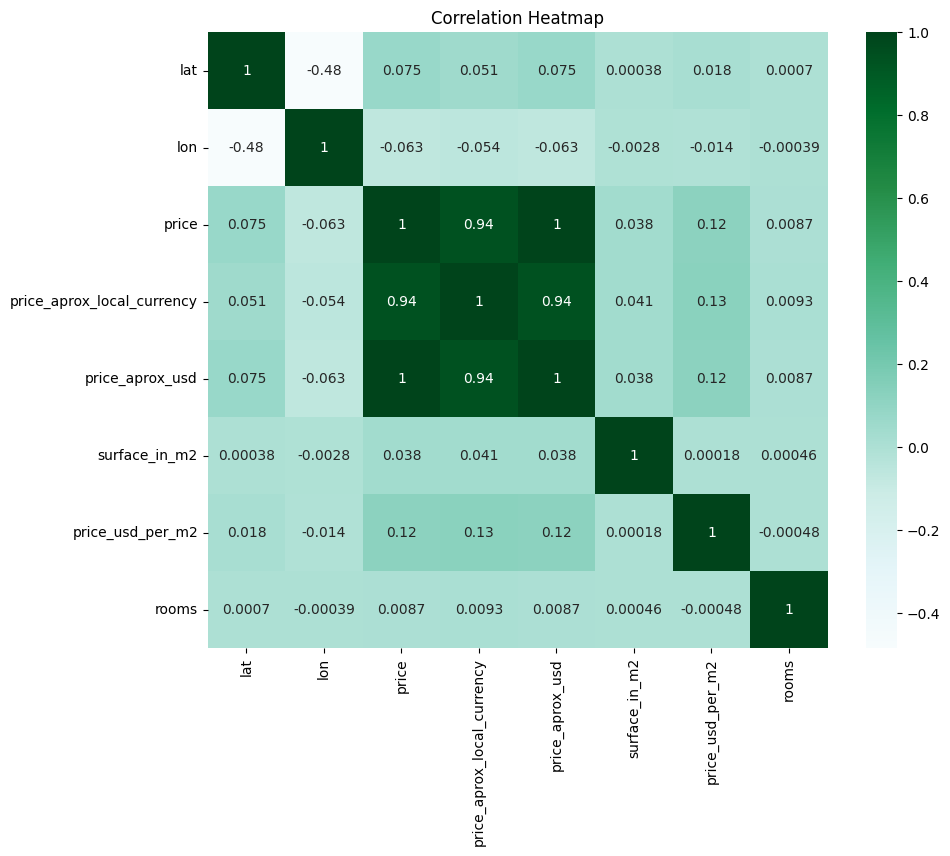

In [85]:
# Eliminar filas con valores NaN en el DataFrame
inmuebles_sin_nans = inmuebles.dropna()

# Crear el mapa de calor de correlación sin NaN
plt.figure(figsize=(10, 8))
sns.heatmap(inmuebles_sin_nans.corr(numeric_only=True), annot=True,color=plt.cm.BuGn)
plt.title("Correlation Heatmap")
plt.show()

Se puede observar que tanto `price_aprox_local_currency` como `price_aprox_usd` tiene una correlacion alta con la columna `price`, esto se condice con el significado de los atributos pues recordemos que `price_aprox_local_currency` es el precio aproximado en la moneda local y `price_aprox_usd` es el precio aproximado de la propiedad en dolares. Podemos eliminar estas columnas para clasificar.  

In [86]:
inmuebles = inmuebles.drop(['price_aprox_local_currency','price_aprox_usd'], axis=1)
#inmuebles = inmuebles.dropna()
inmuebles.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 379231 entries, 4 to 121219
Data columns (total 8 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   property_type     379231 non-null  object 
 1   lat               278193 non-null  float64
 2   lon               278190 non-null  float64
 3   price             379231 non-null  float64
 4   surface_in_m2     309214 non-null  float64
 5   price_usd_per_m2  304494 non-null  float64
 6   rooms             307509 non-null  float64
 7   provincia         379231 non-null  object 
dtypes: float64(6), object(2)
memory usage: 26.0+ MB


In [87]:
inspect_dataframe(inmuebles)

,NaNs #,NaNs %,Type
lon,101041,26.643655,float64
lat,101038,26.642864,float64
price_usd_per_m2,74737,19.707513,float64
rooms,71722,18.912483,float64
surface_in_m2,70017,18.462889,float64
property_type,0,0.000000,object
price,0,0.000000,float64
provincia,0,0.000000,object


Eliminamos los registros que tienen nans.

In [88]:
inmuebles = inmuebles.dropna()

In [89]:
inmuebles.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 188558 entries, 4 to 121217
Data columns (total 8 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   property_type     188558 non-null  object 
 1   lat               188558 non-null  float64
 2   lon               188558 non-null  float64
 3   price             188558 non-null  float64
 4   surface_in_m2     188558 non-null  float64
 5   price_usd_per_m2  188558 non-null  float64
 6   rooms             188558 non-null  float64
 7   provincia         188558 non-null  object 
dtypes: float64(6), object(2)
memory usage: 12.9+ MB


### Ajustando la correlacion entre Superficia y numero de habitaciones

In [131]:
inm=inmuebles.copy()

In [132]:
#SACO PUNTOS ANOMALOS IRREALES

cant_surf_old=inm['rooms'].count()

#Limpieza de Rooms
inm['rooms'] = inm['rooms'].replace(0, 1)
indices2 = inm.index[(inm['rooms'] >= 15) | (inm['rooms'] < 1)]
inm.drop(indices2, inplace=True)
# Crear una única condición utilizando operadores lógicos
condition = ((inm['rooms'] <= 1) & (inm['surface_in_m2'] >= 250)) | \
            ((inm['rooms'] <= 2) & (inm['surface_in_m2'] >= 350)) | \
            ((inm['rooms'] <= 3) & (inm['surface_in_m2'] >= 450)) | \
            ((inm['rooms'] <= 4) & (inm['surface_in_m2'] >= 550)) | \
            ((inm['rooms'] <= 5) & (inm['surface_in_m2'] >= 650)) | \
            ((inm['rooms'] <= 6) & (inm['surface_in_m2'] >= 750))
indices3 = inm[condition].index
inm= inm.drop(indices3)
#print(inm)
# Reemplazar los valores 0 por 1 en la columna 'nombre_columna'
inm['rooms'] = inm['rooms'].replace(0, 1)
#Crear una única condición utilizando operadores lógicos
condition = ((inm['rooms'] >= 6) & (inm['surface_in_m2'] <= 60)) | \
            ((inm['rooms'] >= 7) & (inm['surface_in_m2'] <= 80)) | \
            ((inm['rooms'] >= 8) & (inm['surface_in_m2'] <= 100)) | \
            ((inm['rooms'] >= 9) & (inm['surface_in_m2'] <= 120)) | \
            ((inm['rooms'] >= 10) & (inm['surface_in_m2'] <= 140)) | \
            ((inm['rooms'] >= 11) & (inm['surface_in_m2'] <=160))
indices6 = inm[condition].index
inm= inm.drop(indices6)



cant_surf_new=inm['rooms'].count()
print('Se puede observar que en la caracteristica rooms eliminamos', cant_surf_old-cant_surf_new, 'datos erroneos')
print('')


Se puede observar que en la caracteristica rooms eliminamos 23384 datos erroneos



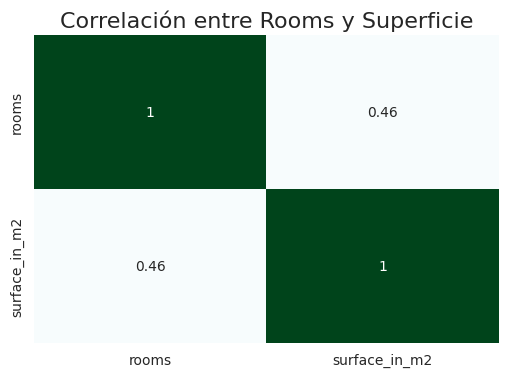

In [133]:
correlation_matrix = inm[['rooms', 'surface_in_m2']].corr()

plt.figure(figsize=(6, 4))
sns.heatmap(correlation_matrix, annot=True, cmap=plt.cm.BuGn, cbar=False)
plt.title('Correlación entre Rooms y Superficie', fontsize=16)
plt.show()

podemos observar que aumento la correlacion entre superficie en metros cuadradoos y la cantidad de habitaciones.

### Ajuste de longitud y latitud

A pesar de que hemos filtrado en pais solo propiedades de Argentina hay datos erroneos procedemos a eliminarlos.

In [134]:
import plotly.express as px
data = inm.copy()
fig = px.scatter_geo(
     data, lat=data.lat, lon=data.lon,
    #color='property_type',
    basemap_visible=True,
    projection='equirectangular'
)
fig.update_geos(
    showcountries=True
)
fig.show()


In [135]:
cant_lonlat_old=inm.shape[0]

#nos quedamos aproximadamente con las coordenadas de argentina, que lastima que no es un pais convexo
inm=inm.loc[(inm['lat']<-21.7811) & (inm['lon']<-50)&(inm['lat']>-73.5666)]
#filtro Uruguay
inm=inm.loc[~((inm['lat']<-34.75)&(inm['lon']>-56.22))]
#filtro punto del sur
inm=inm.loc[~((inm['lat']<-54.30)&(inm['lon']>-64.22))]
#filtro Chile
inm=inm.loc[~((inm['lat']>-35.46)&(inm['lon']<-69.59))]

cant_lonlat_new=inm.shape[0]

print('Eliminamos', cant_lonlat_old-cant_lonlat_new, 'registros que tenian herroneas sus conrdenadas')
print('')

Eliminamos 433 registros que tenian herroneas sus conrdenadas



In [136]:
data = inm.copy()
fig = px.scatter_geo(
     data, lat=data.lat, lon=data.lon,
    #color='property_type',
    basemap_visible=True,
    projection='equirectangular'
)
fig.update_geos(
    showcountries=True
)
fig.show()


### Creacion de la categoria price_range

Como queremos predecir precios en base a las otras caracteristicas de los registros,vamos a crear intervalos de precios usando 3 cuantiles. Es decir que vamos a tener tres clases donde cada una concentrara alrededor de 33% de los registros del dataset.

In [137]:
# Crear columnas de intervalos de precios con igual frecuencia
inm['price_range'] = pd.qcut(inm['price'], q=3).astype(str)
inm=inm.drop(['price'], axis=1)

In [138]:
inm

,property_type,lat,lon,surface_in_m2,price_usd_per_m2,rooms,provincia,price_range
4,house,-34.558247,-58.564806,349.0,315.186246,4.0,buenos aires,"(96000.0, 170000.0]"
11,apartment,-34.597915,-58.417149,32.0,2716.406250,1.0,Capital Federal,"(4999.999, 96000.0]"
12,apartment,-34.597915,-58.417149,49.0,2602.204082,2.0,Capital Federal,"(96000.0, 170000.0]"
17,house,-34.626877,-58.478199,250.0,880.000000,5.0,Capital Federal,"(170000.0, 23000000.0]"
19,apartment,-34.633633,-58.484419,25.0,2076.000000,1.0,Capital Federal,"(4999.999, 96000.0]"
...,...,...,...,...,...,...,...,...
121153,apartment,-34.599214,-58.402519,91.0,2538.461538,1.0,Capital Federal,"(96000.0, 170000.0]"
121158,apartment,-34.587425,-58.397372,44.0,4230.769231,1.0,Capital Federal,"(96000.0, 170000.0]"
121160,apartment,-34.563685,-58.442683,157.0,2611.464968,1.0,Capital Federal,"(170000.0, 23000000.0]"
121209,apartment,-34.563685,-58.442683,157.0,2611.464968,1.0,Capital Federal,"(170000.0, 23000000.0]"


In [139]:
print(inm.price_range.unique())

['(96000.0, 170000.0]' '(4999.999, 96000.0]' '(170000.0, 23000000.0]']


In [140]:

dic= {
    '(4999.999, 96000.0]': 'bajo',
    '(96000.0, 170000.0]': 'medio',
    '(170000.0, 23000000.0]': 'alto'
}

inm['price_range'] = inm['price_range'].map(dic)


In [141]:
inm

,property_type,lat,lon,surface_in_m2,price_usd_per_m2,rooms,provincia,price_range
4,house,-34.558247,-58.564806,349.0,315.186246,4.0,buenos aires,medio
11,apartment,-34.597915,-58.417149,32.0,2716.406250,1.0,Capital Federal,bajo
12,apartment,-34.597915,-58.417149,49.0,2602.204082,2.0,Capital Federal,medio
17,house,-34.626877,-58.478199,250.0,880.000000,5.0,Capital Federal,alto
19,apartment,-34.633633,-58.484419,25.0,2076.000000,1.0,Capital Federal,bajo
...,...,...,...,...,...,...,...,...
121153,apartment,-34.599214,-58.402519,91.0,2538.461538,1.0,Capital Federal,medio
121158,apartment,-34.587425,-58.397372,44.0,4230.769231,1.0,Capital Federal,medio
121160,apartment,-34.563685,-58.442683,157.0,2611.464968,1.0,Capital Federal,alto
121209,apartment,-34.563685,-58.442683,157.0,2611.464968,1.0,Capital Federal,alto


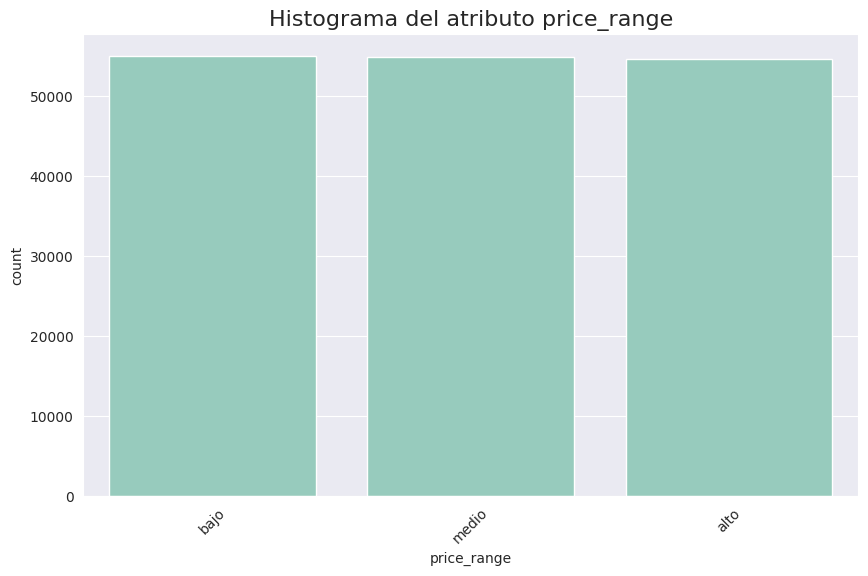

In [142]:
plt.figure(figsize=(10, 6))
sns.set_style("darkgrid")
order_price_range=['bajo','medio','alto']
ax = sns.countplot(x='price_range', data=inm,order=order_price_range, color=plt.cm.BuGn(0.4))
ax.set_title('Histograma del atributo price_range', fontsize=16)
ax.set_xticklabels(ax.get_xticklabels(), rotation=45)
plt.show()

In [144]:
data = inm.copy()
fig = px.scatter_geo(
     data, lat=data.lat, lon=data.lon,
    color='price_range',
    basemap_visible=True,
    projection='equirectangular'
)
fig.update_geos(
    showcountries=True
)
fig.show()

Podemos observar que la proyeccion de los datos en las caterogias `lon` y `lat` no es linealmente sepabale.

Guardamos el dataset para poder volver a cargarlo desde esta instancia.

In [ ]:
inm.to_csv("/content/drive/MyDrive/inmuebles.csv", index=False)

#Modelos

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import math
import missingno as msno
from google.colab import drive
import time

#plt.style.use('default')# Make the graphs a bit prettier

In [2]:
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
path="/content/drive/MyDrive/inmuebles.csv"
inm=pd.read_csv(path)

In [4]:
inm.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 164741 entries, 0 to 164740
Data columns (total 8 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   property_type     164741 non-null  object 
 1   lat               164741 non-null  float64
 2   lon               164741 non-null  float64
 3   surface_in_m2     164741 non-null  float64
 4   price_usd_per_m2  164741 non-null  float64
 5   rooms             164741 non-null  float64
 6   provincia         164741 non-null  object 
 7   price_range       164741 non-null  object 
dtypes: float64(5), object(3)
memory usage: 10.1+ MB


Para poder implementar los metodos pasamos las variables Categoricas a Numericas. Donde contamos la cantidad de clases de la categoria y se le asigna un numero a cada clase de la categoria. Esto se hace para cada categoria por separado

In [5]:
inm['property_type'] = inm['property_type'].factorize()[0]

In [6]:
inm['provincia'] = inm['provincia'].factorize()[0]

Dividimos el dataset en Train y Test, dado que tenemos una gran cantidad de datos y las clases estan balanceadas podemos tomar un 30% para test.

In [7]:
from sklearn.model_selection import train_test_split

X = inm.drop(['price_range'], axis=1).copy()
y = inm['price_range'].copy()
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.30, random_state=42)


##Naive Bayes

In [33]:
from sklearn.naive_bayes import GaussianNB
##---------##
time_old = time.time()
##---------##

modelNBpca = GaussianNB()
modelNBpca.fit(X_train, y_train)

##---------##
time_new= time.time()
elapsed_time = time_new - time_old
print("Tiempo de ejecución:", elapsed_time, 'segundos')
##---------##

y_pred=modelNBpca.predict(X_test)

Tiempo de ejecución: 0.20952820777893066 segundos


Accuracy: 0.45444428707282036
              precision    recall  f1-score   support

        bajo       0.46      0.89      0.61     16694
       medio       0.29      0.18      0.22     16410
        alto       0.70      0.28      0.40     16319

    accuracy                           0.45     49423
   macro avg       0.48      0.45      0.41     49423
weighted avg       0.48      0.45      0.41     49423



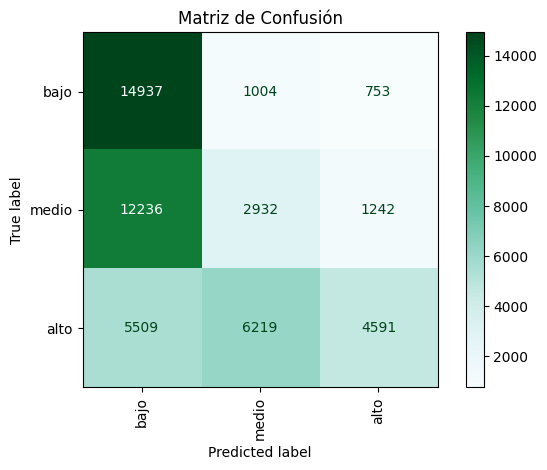

In [34]:
from sklearn.metrics import (confusion_matrix,
                             accuracy_score,
                             classification_report,
                             ConfusionMatrixDisplay,
                             f1_score,
                             recall_score,
                             precision_score
                             )

# Calcular métricas de evaluación
accuracy = accuracy_score(y_test, y_pred)

print("Accuracy:", accuracy)


classes=['bajo','medio','alto']

display=ConfusionMatrixDisplay.from_predictions(
    y_test, y_pred, labels=classes, cmap=plt.cm.BuGn, xticks_rotation='vertical')
print(classification_report(y_test, y_pred, labels=classes))

plt.title('Matriz de Confusión')
plt.tight_layout()
plt.show()


Es de esperarse que no de bien este modelo ya que su proyeccion en las variables lon y lat no estaban ``acumuladas´´ las clases.

In [ ]:
#guardamos la variable para no ejecutar nuevamente el modelo
y_prednbpca =  pd.DataFrame({'y_prednbpca': y_pred,'time':elapsed_time, 'accuracy': accuracy})
y_prednbpca.to_csv("/content/drive/MyDrive/proyecto/y_prednbpca.csv", index=False)
#path="/content/drive/MyDrive/proyecto/y_prednbpca.csv"
#y_prednbpca=pd.read_csv(path)


## Perceptron

In [108]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

In [ ]:
from sklearn.linear_model import Perceptron

##---------##
time_old = time.time()
##---------##

model = Perceptron(tol=1e-3,random_state=42)
model.fit(X_train, y_train)

##---------##
time_new= time.time()
elapsed_time = time_new - time_old
##---------##

print("Tiempo de ejecución:", elapsed_time, 'segundos')
y_pred= model.predict(X_test)
# Calcular precisión del modelo
accuracy_per = accuracy_score(y_test, y_pred)


Tiempo de ejecución: 0.585381031036377 segundos


Accuracy: 0.6158468729134209
              precision    recall  f1-score   support

        bajo       0.69      0.70      0.69     16694
       medio       0.47      0.42      0.45     16410
        alto       0.66      0.73      0.69     16319

    accuracy                           0.62     49423
   macro avg       0.61      0.62      0.61     49423
weighted avg       0.61      0.62      0.61     49423



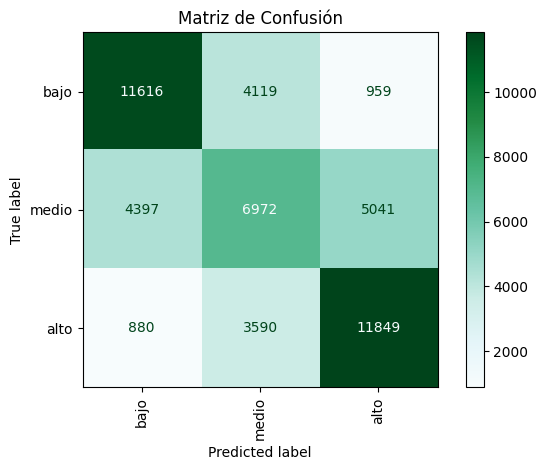

In [ ]:
# Calcular métricas de evaluación
accuracy = accuracy_score(y_test, y_pred)

print("Accuracy:", accuracy)


classes=['bajo','medio','alto']

display=ConfusionMatrixDisplay.from_predictions(
    y_test, y_pred, labels=classes, cmap=plt.cm.BuGn, xticks_rotation='vertical')
print(classification_report(y_test, y_pred, labels=classes))

plt.title('Matriz de Confusión')
plt.tight_layout()
plt.show()

El bajo accuracy indica que los datos no son linealmente separables. Notar que la clase que mas se confunde es la de `medio`, esto lo podemos ver en el recall,  la cual ``intenta repartir´´ entre las otras dos clases, como asi tambien clasifica alrededor de un 30% de las demas clases como la `medio`.

In [ ]:
#guardamos la variable para no ejecutar nuevamente el modelo
y_predper =  pd.DataFrame({'y_predper': y_pred,'time':elapsed_time,'accuracy': accuracy})
y_predper.to_csv("/content/drive/MyDrive/proyecto/y_predper.csv", index=False)
#path="/content/drive/MyDrive/proyecto/y_prednbpca.csv"
#y_prednbpca=pd.read_csv(path)

In [104]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.30, random_state=42)

##  K-Nearest Neighbors

In [ ]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score

accuracy_knns2 = []
timesknn2=[]
n_neighbors = []
for k in  np.concatenate((np.arange(1,6)*2,np.arange(1,10)*10)):

  ##---------##
  time_old = time.time()
  ##---------##

  knn_clf = KNeighborsClassifier(n_neighbors=k,p=2)
  knn_clf.fit(X_train,y_train)

  ##---------##
  time_new= time.time()
  elapsed_time = time_new - time_old
  ##---------##

  y_pred_knn = knn_clf.predict(X_test)
  # Calcular precisión del modelo
  accuracy_knn = accuracy_score(y_test.values, y_pred_knn)
  accuracy_knns2.append(accuracy_knn)
  timesknn2.append(elapsed_time)
  n_neighbors.append(k)

In [ ]:
accuracy_knns1 = []
timesknn1=[]
for k in  np.concatenate((np.arange(1,6)*2,np.arange(1,10)*10)):

  ##---------##
  time_old = time.time()
  ##---------##

  knn_clf = KNeighborsClassifier(n_neighbors=k,p=1)
  knn_clf.fit(X_train,y_train)

  ##---------##
  time_new= time.time()
  elapsed_time = time_new - time_old
  ##---------##

  y_pred_knn = knn_clf.predict(X_test)
  # Calcular precisión del modelo
  accuracy_knn = accuracy_score(y_test.values, y_pred_knn)
  accuracy_knns1.append(accuracy_knn)
  timesknn1.append(elapsed_time)


In [ ]:
knn =  pd.DataFrame({'n_neighbors': n_neighbors, 'euclidean': accuracy_knns2,'times_euclidean':timesknn2, 'manhattan': accuracy_knns1,'times_manhattan':timesknn1})
knn.to_csv("/content/drive/MyDrive/proyecto/knn.csv", index=False)

In [ ]:
path="/content/drive/MyDrive/proyecto/knn.csv"
knn=pd.read_csv(path)

In [ ]:
knn.drop(['n_neighbors', 'euclidean', 'manhattan'], axis=1).sum().sum()

10.607792377471924

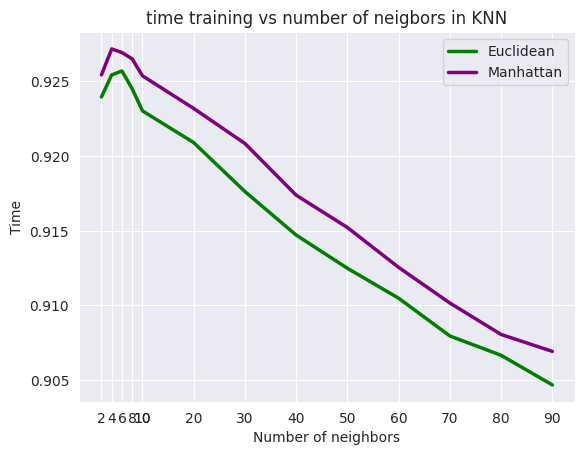

In [ ]:
sns.lineplot(x='n_neighbors', y='euclidean', data=knn, linewidth=2.5,label='Euclidean',color='green')
sns.lineplot(x='n_neighbors', y='manhattan', data=knn, linewidth=2.5,label='Manhattan',color='purple')

plt.xticks(ticks=knn['n_neighbors'])
plt.xlabel('Number of neighbors')
plt.ylabel('Time')
plt.title('time training vs number of neigbors in KNN')
plt.legend()
plt.show()

Creo que por como se veain los puntos proyectados en el mapa, la cual es una proyeccion de las categorias `lon` y `lat`, tiene sentido que tenga un buen desempeño con 4 vecinos cercanos por que tenemos algunas ciudades que tienen pocos datos.

In [ ]:

##---------##
time_old = time.time()
##---------##

knn_clf = KNeighborsClassifier(n_neighbors=4,p=1)
knn_clf.fit(X_train,y_train)

##---------##
time_new= time.time()
elapsed_time = time_new - time_old
print("Tiempo de ejecución:", elapsed_time, 'segundos')
##---------##

y_pred = knn_clf.predict(X_test)

Tiempo de ejecución: 0.8538253307342529 segundos


Accuracy: 0.9271796531979039
              precision    recall  f1-score   support

        bajo       0.96      0.94      0.95     16694
       medio       0.93      0.86      0.90     16410
        alto       0.89      0.98      0.93     16319

    accuracy                           0.93     49423
   macro avg       0.93      0.93      0.93     49423
weighted avg       0.93      0.93      0.93     49423



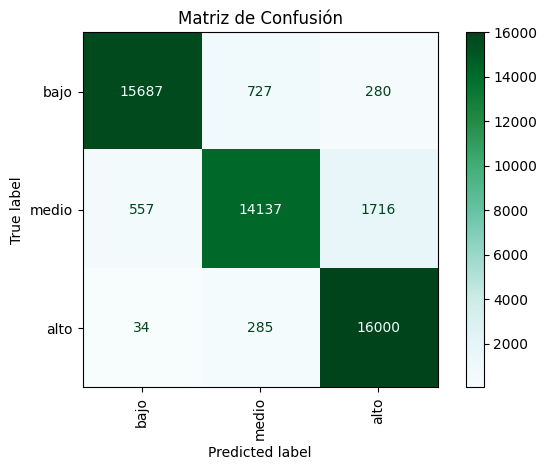

In [ ]:
from sklearn.metrics import (confusion_matrix,
                             accuracy_score,
                             classification_report,
                             ConfusionMatrixDisplay,
                             f1_score,
                             recall_score,
                             precision_score
                             )

# Calcular métricas de evaluación
accuracy = accuracy_score(y_test, y_pred)

print("Accuracy:", accuracy)


classes=['bajo','medio','alto']

display=ConfusionMatrixDisplay.from_predictions(
    y_test, y_pred, labels=classes, cmap=plt.cm.BuGn, xticks_rotation='vertical')
print(classification_report(y_test, y_pred, labels=classes))

plt.title('Matriz de Confusión')
plt.tight_layout()
plt.show()

podemos observar que lo que mas se confunde el modelo es en clasificar clase media diciendo que es alta.

In [ ]:
#guardamos la variable para no ejecutar nuevamente el modelo
y_predknn =  pd.DataFrame({'y_predknn': y_pred,'time':elapsed_time,'accuracy': accuracy})
y_predknn.to_csv("/content/drive/MyDrive/proyecto/y_predknn.csv", index=False)
#path="/content/drive/MyDrive/proyecto/y_prednbpca.csv"
#y_prednbpca=pd.read_csv(path)

## Arbol

In [ ]:
from sklearn import tree

##---------##
time_old = time.time()
##---------##

tree1= tree.DecisionTreeClassifier(criterion='entropy',
                                   random_state=42,
                                   min_samples_split=500,
                                   min_samples_leaf=100
                                   )
tree1 =tree1.fit(X_train,y_train)
y_pred=tree1.predict(X_test)

##---------##
time_new= time.time()
elapsed_time = time_new - time_old
print("Tiempo de ejecución:", elapsed_time, 'segundos')
##---------##

Tiempo de ejecución: 1.7081427574157715 segundos


Este arbol va a dividir nuevamente una hoja si tiene mas del %5 (`min_samples_split=500` ) aproximadamente los datos en ella y con la restriccion de que una hoja tiene que tenes como minimo aproximadamente el %1 (`min_samples_leaf=100`) de los datos.  

Accuracy: 0.9080994678590939
              precision    recall  f1-score   support

        bajo       0.97      0.90      0.94     16694
       medio       0.88      0.86      0.87     16410
        alto       0.88      0.96      0.92     16319

    accuracy                           0.91     49423
   macro avg       0.91      0.91      0.91     49423
weighted avg       0.91      0.91      0.91     49423



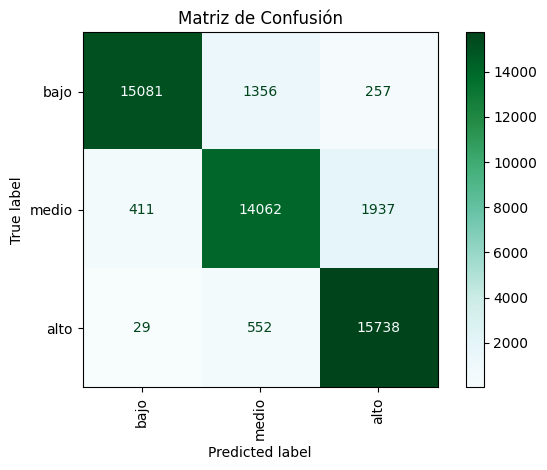

In [ ]:
from sklearn.metrics import (confusion_matrix,
                             accuracy_score,
                             classification_report,
                             ConfusionMatrixDisplay,
                             f1_score,
                             recall_score,
                             precision_score
                             )

# Calcular métricas de evaluación
accuracy = accuracy_score(y_test, y_pred)

print("Accuracy:", accuracy)


classes=['bajo','medio','alto']

display=ConfusionMatrixDisplay.from_predictions(
    y_test, y_pred, labels=classes, cmap=plt.cm.BuGn, xticks_rotation='vertical')
print(classification_report(y_test, y_pred, labels=classes))

plt.title('Matriz de Confusión')
plt.tight_layout()
plt.show()

In [ ]:
#guardamos la variable para no ejecutar nuevamente el modelo
y_predtree500100 =  pd.DataFrame({'y_predtree500100': y_pred,'time':elapsed_time,'accuracy': accuracy})
y_predtree500100.to_csv("/content/drive/MyDrive/proyecto/y_predtree500100.csv", index=False)
#path="/content/drive/MyDrive/proyecto/y_prednbpca.csv"
#y_prednbpca=pd.read_csv(path)

In [107]:
plt.figure(figsize=(150,80))
tree.plot_tree(tree1,filled=True,fontsize=10)

[Text(0.4250822961760462, 0.9666666666666667, 'x[3] <= 65.5\nentropy = 1.585\nsamples = 115318\nvalue = [38385, 38350, 38583]'),
 Text(0.15395021645021645, 0.9, 'x[4] <= 2437.628\nentropy = 1.216\nsamples = 53701\nvalue = [3071, 31626, 19004]'),
 Text(0.049107142857142856, 0.8333333333333334, 'x[3] <= 45.5\nentropy = 0.773\nsamples = 36224\nvalue = [0, 27994, 8230]'),
 Text(0.012987012987012988, 0.7666666666666667, 'x[4] <= 2155.409\nentropy = 0.186\nsamples = 18471\nvalue = [0, 17946, 525]'),
 Text(0.005772005772005772, 0.7, 'x[4] <= 2144.667\nentropy = 0.001\nsamples = 14035\nvalue = [0, 14034, 1]'),
 Text(0.002886002886002886, 0.6333333333333333, 'entropy = 0.0\nsamples = 13927\nvalue = [0, 13927, 0]'),
 Text(0.008658008658008658, 0.6333333333333333, 'entropy = 0.076\nsamples = 108\nvalue = [0, 107, 1]'),
 Text(0.020202020202020204, 0.7, 'x[3] <= 40.5\nentropy = 0.524\nsamples = 4436\nvalue = [0, 3912, 524]'),
 Text(0.01443001443001443, 0.6333333333333333, 'x[4] <= 2404.212\nentropy

###Arbol con Prunning

In [12]:
tree_poda=tree.DecisionTreeClassifier(criterion='entropy',
                                      random_state=42
                                      )
##---------##
time_old = time.time()
##---------##
path= tree_poda.cost_complexity_pruning_path(X_train,y_train)
ccp_alphas, impurities = path.ccp_alphas,path.impurities

In [13]:
clfs =[]

for ccp_alpha in ccp_alphas:
  clf=tree.DecisionTreeClassifier(criterion='entropy',random_state=42,ccp_alpha=ccp_alpha)
  clf.fit(X_train,y_train)
  clfs.append(clf)

##---------##
time_new= time.time()
elapsed_time = time_new - time_old
print("Tiempo de ejecución:", elapsed_time, 'segundos')
##---------##

Tiempo de ejecución: 4706.240031957626 segundos


In [14]:
clfs1 =  pd.DataFrame({'ccp_alphas': ccp_alphas, 'impurities': impurities,'clfs':clfs})
clfs1.to_csv("/content/drive/MyDrive/proyecto/clfs1.csv", index=False)


In [15]:
#path="/content/drive/MyDrive/proyecto/clfs1.csv"
#clfs1=pd.read_csv(path)

In [18]:
##---------##
time_old = time.time()
##---------##

train_scores= [clf.score(X_train,y_train) for clf in clfs]
test_scores = [clf.score(X_test,y_test) for clf in clfs]


##---------##
time_new= time.time()
elapsed_time = time_new - time_old
print("Tiempo de ejecución:", elapsed_time, 'segundos')
##---------##

Tiempo de ejecución: 1075.9279894828796 segundos


In [19]:
train_test_scores_pruning =  pd.DataFrame({'train_scores': train_scores, 'test_scores': test_scores})
train_test_scores_pruning.to_csv("/content/drive/MyDrive/proyecto/train_test_scores_pruning.csv", index=False)

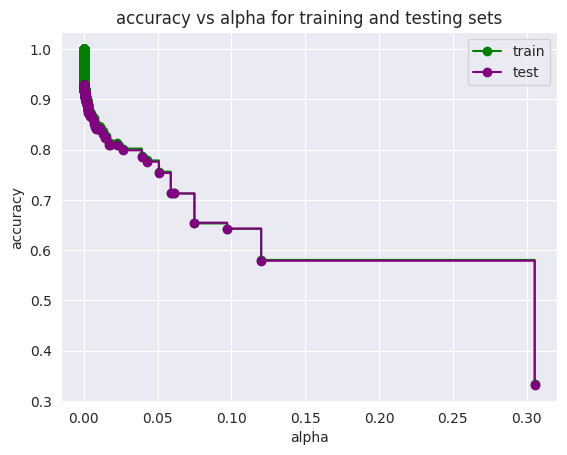

In [114]:
fig,ax = plt.subplots()
ax.set_xlabel('alpha')
ax.set_ylabel('accuracy')
ax.set_title('accuracy vs alpha for training and testing sets')

ax.plot(ccp_alphas, train_scores, marker='o', label='train', drawstyle='steps-post', color='green')

ax.plot(ccp_alphas, test_scores, marker='o', label='test', drawstyle='steps-post', color='purple')

ax.legend()
plt.show()
ax.legend()
plt.show()

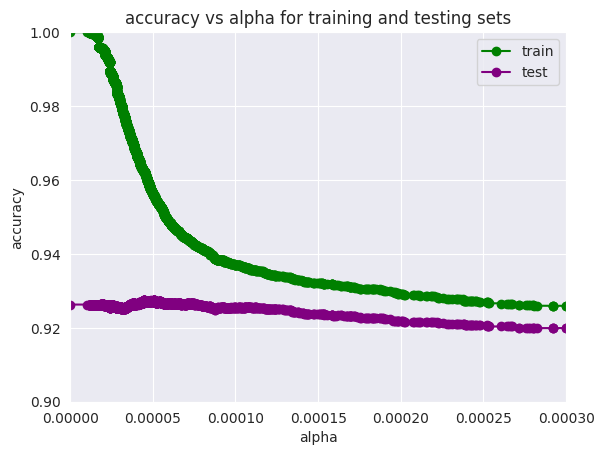

In [115]:
fig,ax = plt.subplots()
ax.set_xlabel('alpha')
ax.set_ylabel('accuracy')
ax.set_title('accuracy vs alpha for training and testing sets')
ax.plot(ccp_alphas, train_scores, marker ='o',label='train',drawstyle='steps-post',color='green')
ax.plot(ccp_alphas, test_scores, marker ='o',label='test',drawstyle='steps-post', color='purple')
plt.xlim(0,0.0003)
plt.ylim(0.90,1)
ax.legend()
plt.show()

In [35]:
clf=tree.DecisionTreeClassifier(ccp_alpha=0.00005)
clf.fit(X,y)
y_pred=clf.predict(X_test)
print('accuracy con test',clf.score(X_test,y_test))

accuracy con test 0.9297088400137588


Accuracy: 0.9297088400137588
              precision    recall  f1-score   support

        bajo       0.99      0.92      0.95     16694
       medio       0.91      0.89      0.90     16410
        alto       0.90      0.98      0.94     16319

    accuracy                           0.93     49423
   macro avg       0.93      0.93      0.93     49423
weighted avg       0.93      0.93      0.93     49423



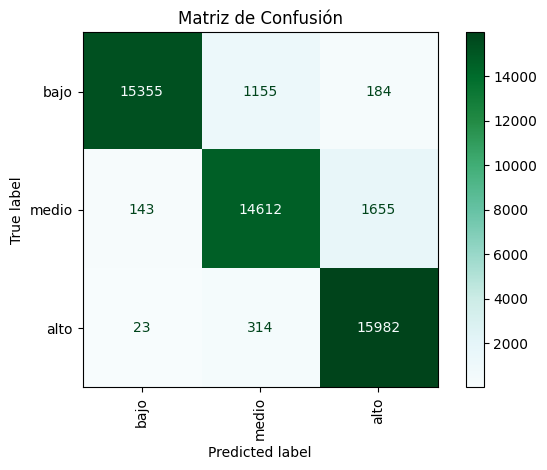

In [36]:
# Calcular métricas de evaluación
accuracy = accuracy_score(y_test, y_pred)

print("Accuracy:", accuracy)


classes=['bajo','medio','alto']

display=ConfusionMatrixDisplay.from_predictions(
    y_test, y_pred, labels=classes, cmap=plt.cm.BuGn, xticks_rotation='vertical')
print(classification_report(y_test, y_pred, labels=classes))

plt.title('Matriz de Confusión')
plt.tight_layout()
plt.show()

## Random Forest

In [ ]:
from sklearn.ensemble import RandomForestClassifier

##---------##
time_old = time.time()
##---------##

# Crear un clasificador Random Forest
forest = RandomForestClassifier(
    n_estimators=20,           # Número de árboles en el bosque
    criterion='entropy',       # Criterio utilizado para medir la calidad de una partición ('gini' o 'entropy')
    max_depth=None,            # Profundidad máxima de los árboles (None significa que los árboles se expanden hasta que todas las hojas sean puras o contengan min_samples_split muestras)
    max_features='sqrt',       # Número de características a considerar al buscar la mejor partición ('sqrt' utiliza la raíz cuadrada del número total de características)
    min_samples_leaf=2,        # Número mínimo de muestras requeridas para ser una hoja en un árbol
    min_samples_split=2,       # Número mínimo de muestras requeridas para dividir un nodo interno
    random_state=42            # Semilla utilizada por el generador de números aleatorios para reproducibilidad
)

forest.fit(X_train, y_train)

##---------##
time_new= time.time()
elapsed_time_entropy = time_new - time_old
print("Tiempo de ejecución:", elapsed_time, 'segundos')
##---------##

y_pred=forest.predict(X_test)

Tiempo de ejecución: 9.262544631958008 segundos


Accuracy: 0.9354146854703276
              precision    recall  f1-score   support

        bajo       0.98      0.94      0.96     16694
       medio       0.91      0.91      0.91     16410
        alto       0.93      0.96      0.94     16319

    accuracy                           0.94     49423
   macro avg       0.94      0.94      0.94     49423
weighted avg       0.94      0.94      0.94     49423



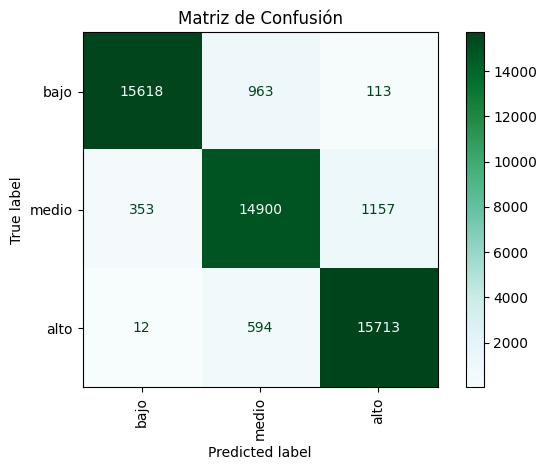

In [ ]:
from sklearn.metrics import (confusion_matrix,
                             accuracy_score,
                             classification_report,
                             ConfusionMatrixDisplay,
                             f1_score,
                             recall_score,
                             precision_score
                             )

# Calcular métricas de evaluación
accuracy_entropy = accuracy_score(y_test, y_pred)

print("Accuracy:", accuracy_entropy)


classes=['bajo','medio','alto']

display=ConfusionMatrixDisplay.from_predictions(
    y_test, y_pred, labels=classes, cmap=plt.cm.BuGn, xticks_rotation='vertical')
print(classification_report(y_test, y_pred, labels=classes))

plt.title('Matriz de Confusión')
plt.tight_layout()
plt.show()

elapsed_time_entropy=elapsed_time
y_pred_entropy=y_pred

In [ ]:
##---------##
time_old = time.time()
##---------##

# Crear un clasificador Random Forest
forest = RandomForestClassifier(
    n_estimators=20,           # Número de árboles en el bosque
    criterion='gini',       # Criterio utilizado para medir la calidad de una partición ('gini' o 'entropy')
    max_depth=None,            # Profundidad máxima de los árboles (None significa que los árboles se expanden hasta que todas las hojas sean puras o contengan min_samples_split muestras)
    max_features='sqrt',       # Número de características a considerar al buscar la mejor partición ('sqrt' utiliza la raíz cuadrada del número total de características)
    min_samples_leaf=2,        # Número mínimo de muestras requeridas para ser una hoja en un árbol
    min_samples_split=2,       # Número mínimo de muestras requeridas para dividir un nodo interno
    random_state=42            # Semilla utilizada por el generador de números aleatorios para reproducibilidad
)

forest.fit(X_train, y_train)

##---------##
time_new= time.time()
elapsed_time_entropy = time_new - time_old
print("Tiempo de ejecución:", elapsed_time, 'segundos')
##---------##

y_pred=forest.predict(X_test)

Tiempo de ejecución: 9.262544631958008 segundos


Accuracy: 0.9348076806345224
              precision    recall  f1-score   support

        bajo       0.98      0.94      0.96     16694
       medio       0.90      0.91      0.91     16410
        alto       0.92      0.96      0.94     16319

    accuracy                           0.93     49423
   macro avg       0.94      0.93      0.93     49423
weighted avg       0.94      0.93      0.93     49423



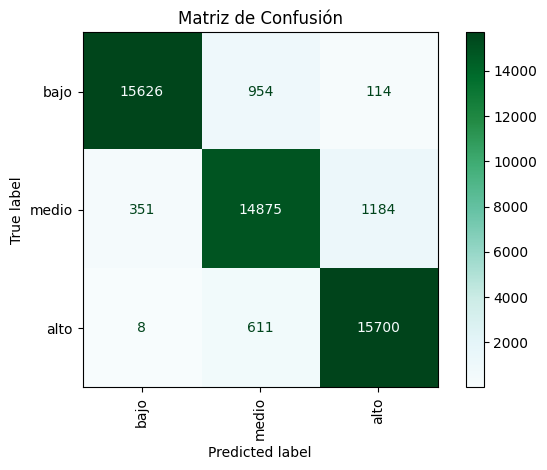

In [ ]:
# Calcular métricas de evaluación
accuracy_gini = accuracy_score(y_test, y_pred)

print("Accuracy:", accuracy_gini)


classes=['bajo','medio','alto']

display=ConfusionMatrixDisplay.from_predictions(
    y_test, y_pred, labels=classes, cmap=plt.cm.BuGn, xticks_rotation='vertical')
print(classification_report(y_test, y_pred, labels=classes))

plt.title('Matriz de Confusión')
plt.tight_layout()
plt.show()


elapsed_time_gini=elapsed_time
y_pred_gini=y_pred


In [ ]:
#guardamos la variable para no ejecutar nuevamente el modelo
y_predrand =  pd.DataFrame({'y_pred': [y_pred_entropy,y_pred_gini],'time':[elapsed_time_entropy,elapsed_time_gini],'accuracy': [accuracy_entropy,accuracy_gini]})
y_predrand.to_csv("/content/drive/MyDrive/proyecto/y_predrand.csv", index=False)
#path="/content/drive/MyDrive/proyecto/y_prednbpca.csv"
#y_prednbpca=pd.read_csv(path)

#Conclusion

| Modelo      | Accuracy | Tiempo de Entrenamiento (s) |
|-------------|----------|----------------------------|
| Naive Bayes | 0.454444   | 0.209528                     |
| Perceptron  | 0.615846    | 0.585381                     |
|KNN Manhattan|0.927179|10.607792*|
| Arbol       | 0.908099    | 1.708142                   |
| Arbol con Pruning      | 0.9297     | 5782.16802*                   |
|Random Forest Entropy|0.935414| 9.262544|
|Random Forest Gini|0.934807|9.262544|

Como se indico anteriormente es esperable que Naïve Bayes y Perceptron no tengan una buena performance. Ya con un Arbol se llega a un muy buena clasificacion con un accuracy del 0.908099, para poder mejorer el desempeño.La primera idea fue realizando purnning, se esperaba que no tan costoso en el sentido del timepo. Se pudo mejorar la clasificacion solo un 2% es decir que alrededor de 300 registros mas pudimos clasificar correctamente. Bajo esa linea implementamos KNN el cual en sentidos de accuracy tiempo tuvo un rendimiento muchisimo mejor, casi igualando la camntidad de registros bien clasificados al Arbol con Pruning.
Luego implementamos Random forest con los dos criterios Gini y Shannon resultando este ultimo teniendo el mejor rendimiendo de todos los metodos que realizamos. Pero si observamos la tabla KNN no lo alcanza por poco en performance.  

*En los metodos Knn y Arbol con Pruning se suma el tiempo de encontrar los mejores parametros.
